<a href="https://colab.research.google.com/github/Pranav4860/ES114-PSDV/blob/main/Image_Binarization_otsu.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
pg1= cv2.imread('/content/drive/MyDrive/Otsu/bookpage_1.jpeg',0)
pg2=cv2.imread('/content/drive/MyDrive/Otsu/bookpage_2.jpeg',0)
pntr=cv2.imread('/content/drive/MyDrive/Otsu/panther.jpeg',0)
tom=cv2.imread('/content/drive/MyDrive/Otsu/tom.jpeg',0)


In [ ]:
#frequency histogram
fpg1=pg1.flatten()
fpg2=pg2.flatten()
fpntr=pntr.flatten()
ftom=tom.flatten()
zpg1,zpg2,zpntr,ztom=[0]*256,[0]*256,[0]*256,[0]*256
for i in fpg1 :
  zpg1[i]+=1
for i in fpg2 :
  zpg2[i]+=1
for i in fpntr :
  zpntr[i]+=1
for i in ftom :
  ztom[i]+=1

# Functions

Otsu's Method

In [ ]:
def otsu(z,img):
  tp=img.shape[0]*img.shape[1]
  zpdf= np.array(z)/tp
  v=[]
  for t in range(0,256):
    c1=zpdf[1:t+1]
    c2=zpdf[t+1:]
    w1=sum(c1)
    w2=sum(c2)
    m1=0
    m2=0
    for i in range(1,t+1):
      m1+=(i*c1[i-1])/w1
    for i in range(t+1,256):
      m2+=i*c2[i-(t+1)]/w2
    mu1=m1
    mu2=m2
    v1=w1*w2*((mu1-mu2)**2)
    v.append(v1)
  vmax=max(v)
  t1=v.index(vmax)
  fimg=img.flatten()
  for i in range(len(fimg)):
    if fimg[i]>t1:
      fimg[i]=255
    else:
      fimg[i]=0
  oimg=fimg.reshape(img.shape[0],img.shape[1])
  return oimg

bwpg1=otsu(zpg1,pg1)
bwpg2=otsu(zpg2,pg2)
bwpntr=otsu(zpntr,pntr)
bwtom=otsu(ztom,tom)

In this I took frequency of pixel intensity (z) and image intensity array (img) and divided z with the total number of pixels to convert it to cdf. In this, firstly I ran a for loop taking all the possible values of threshold(t). Then made 2 clusters c1 and c2 breaking the cdf array or list across t. w1 and w2 would be sum of c1 and c2. thenfound mu1 and mu2 from the next 2 loops. v1 is the between class variance(v1). Then appended it in an empty list(v). then found the index of max element from the list. As the index of the max element would be its threshold. As we need to maximize the between class variance by the formula ($ \sigma^{2}_b(t) = w_1(t)w_2(t)[\mu_1(t)-\mu_2(t)]^{2}$). Then, I compared all the pixel intesities of the image with threshold and replaced them with 0 or 255 if it is less than or more than threshold respectively.And returned the new image intensity array.

For plotting images and graph

In [ ]:
def ot_plot_img(img1,img2):
  fig,ax=plt.subplots(nrows=1,ncols=2)
  fig.set_figwidth(15)
  fig.set_figheight(6)
  ax[0].imshow(img1,cmap='gray')
  ax[0].axis('off')
  ax[0].set_title('Original Image')
  ax[1].imshow(img2,cmap='gray')
  ax[1].axis('off')
  ax[1].set_title('After Utso Image')
  fig.tight_layout()
  plt.show()
def ot_plot_hist(img1,img2):
  p=range(256)
  z1,z2=[0]*256,[0]*256
  for i in img1.flatten():
    z1[i]+=1
  for i in img2.flatten():
    z2[i]+=1
  fig,ax=plt.subplots(nrows=1,ncols=2)
  fig.set_figwidth(15)
  fig.set_figheight(6)
  ax[0].bar(p,z1, width = 0.7)
  ax[0].set_title('Histogram of Original Image')
  ax[0].set_xlabel('Intensity')
  ax[0].set_ylabel('Number of Pixel')
  ax[1].bar(p,z2, width = 0.7)
  ax[1].set_title('Histogram of Utso Image')
  ax[1].set_xlabel('Intensity')
  ax[1].set_ylabel('Number of Pixel')
  fig.tight_layout()
  plt.show()

# Images and processed images

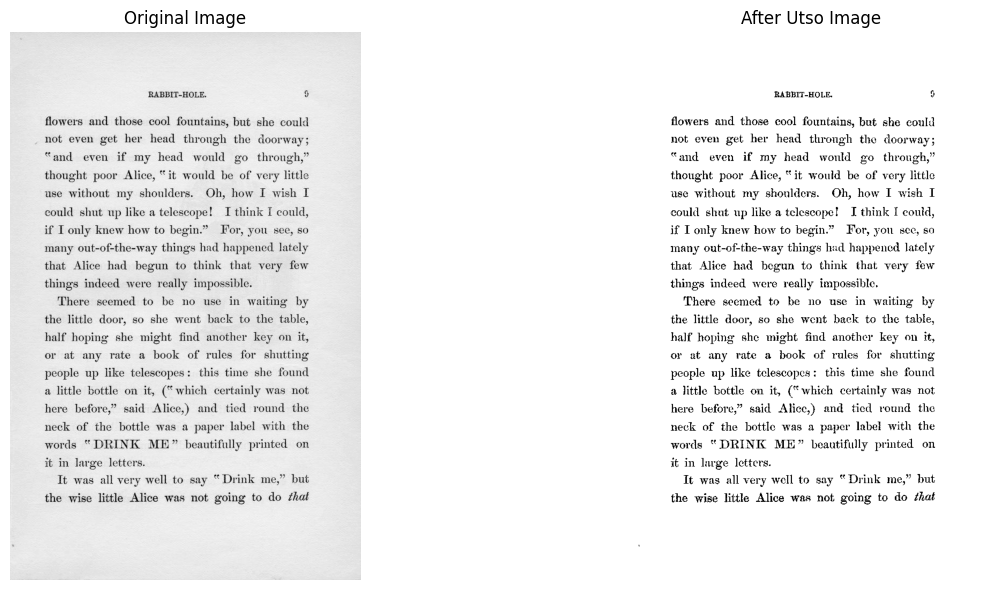

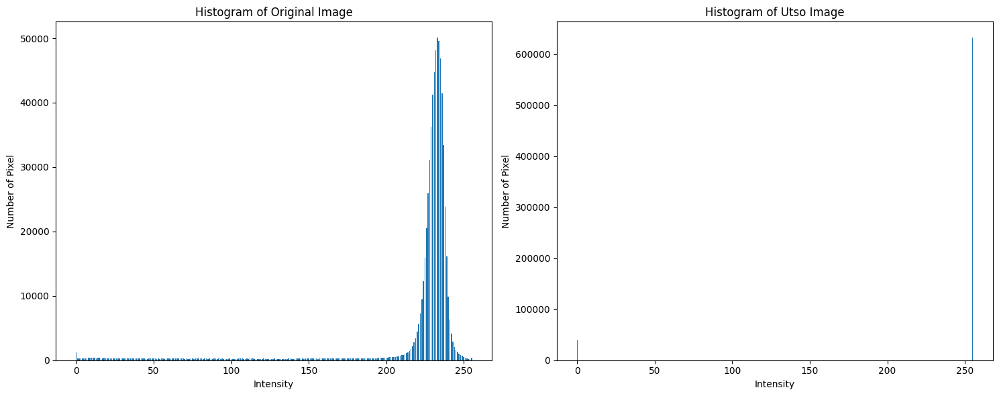

In [ ]:
ot_plot_img(pg1,bwpg1)
ot_plot_hist(pg1,bwpg1)

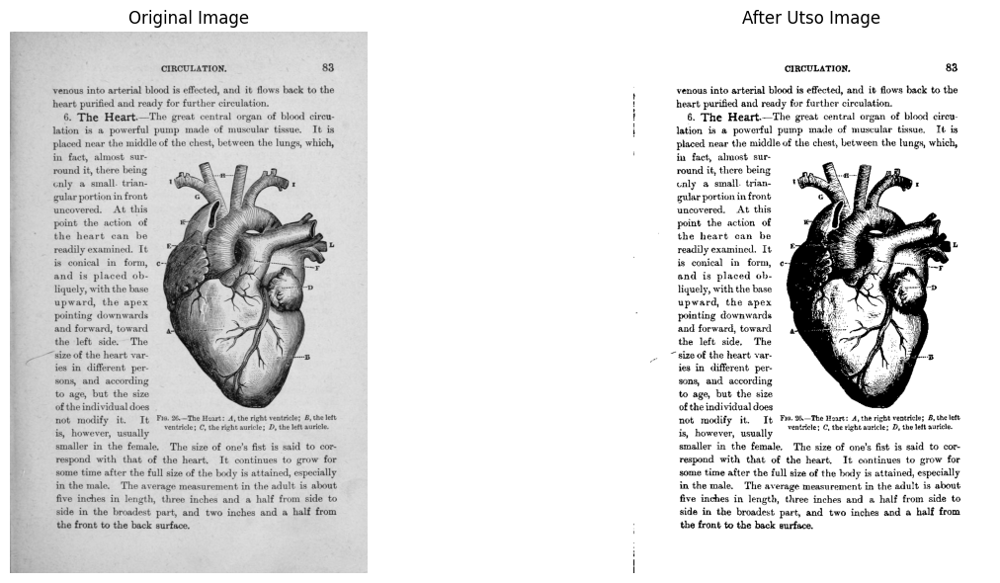

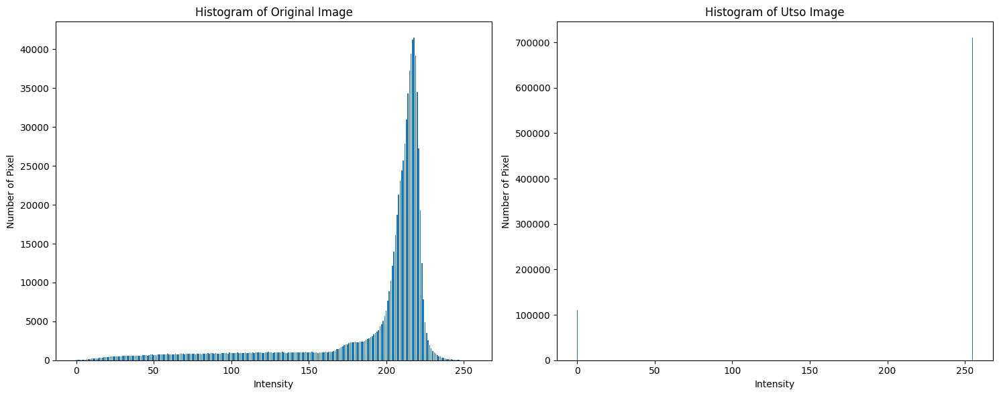

In [ ]:
ot_plot_img(pg2,bwpg2)
ot_plot_hist(pg2,bwpg2)

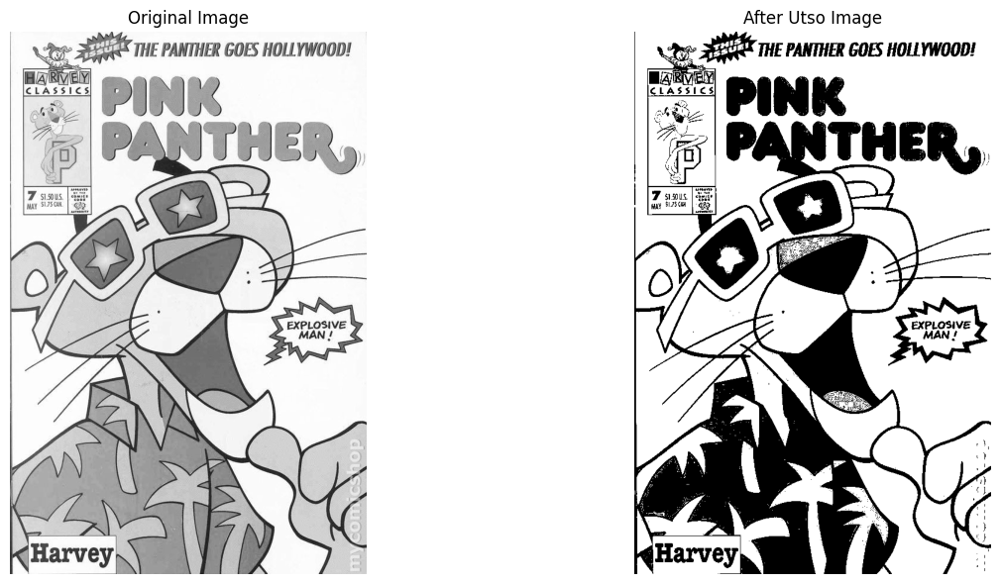

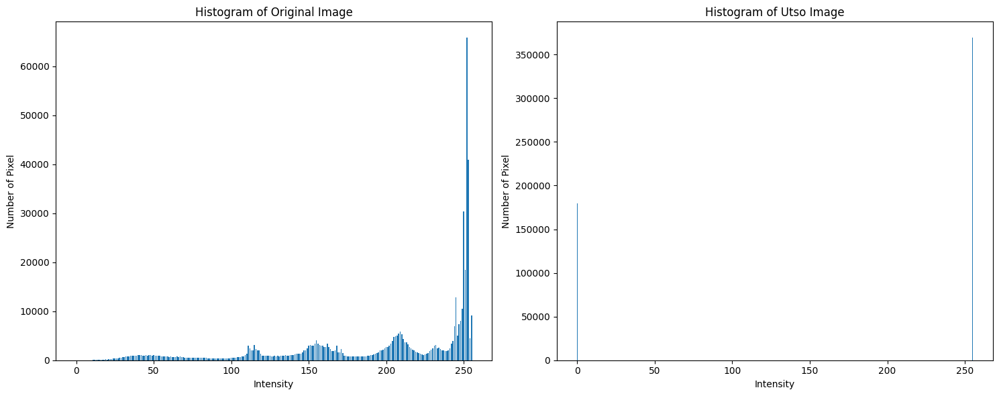

In [ ]:
ot_plot_img(pntr,bwpntr)
ot_plot_hist(pntr,bwpntr)

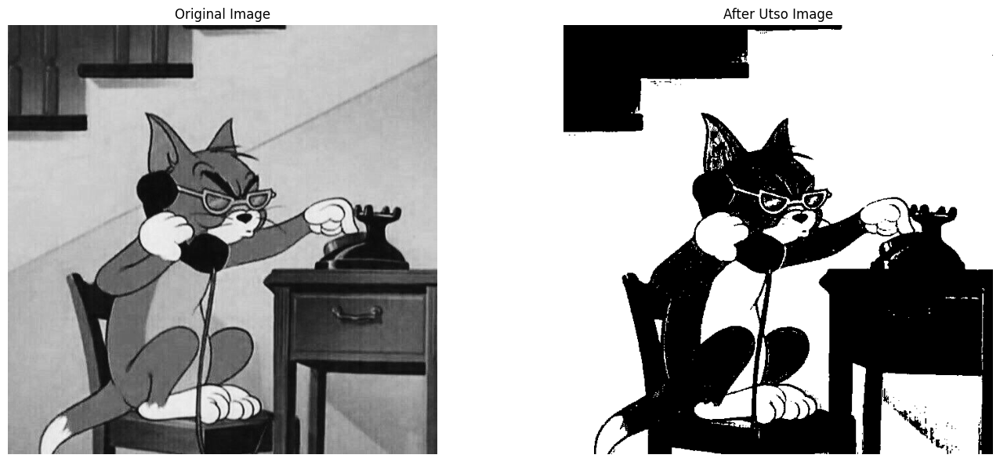

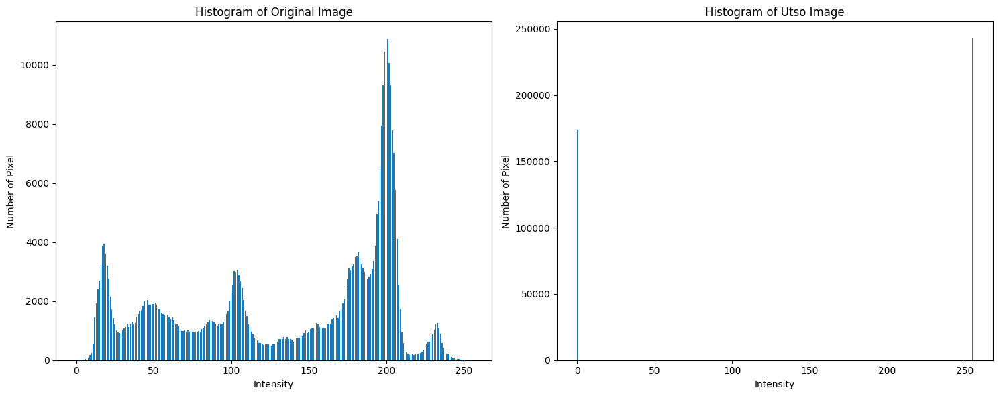

In [ ]:
ot_plot_img(tom,bwtom)
ot_plot_hist(tom,bwtom)

# Noise addition Functions

In [ ]:
def noisy(img):
  v=int(input())
  gn= np.random.normal(0,v**0.5,img.shape)
  nimg=gn+img
  nimg=np.array(nimg)
  nimg=nimg.round()
  nimgf=nimg.flatten()
  for i in range(len(nimgf)):
    if nimgf[i]<0:
      nimgf[i]=0
    elif nimgf[i]>255:
      nimgf[i]=255
  z=[0]*256
  for i in nimgf:
    z[int(i)]+=1
  nimgf2d=nimgf.reshape(img.shape[0],img.shape[1])
  return otsu(z,nimgf2d)

In this function, img would be the 2-D array of pixel intensities. I am first taking the variance as user input, then I am using np.random.normal function to get an array of gaussian noise which I am adding to the image pixel intensities. Then rounding it amd flattening it. then i checked all the pixel intensities to clip it between 0 and 255 i.e. if they are less than 0 replacing it with 0 and if they are more than 255 replacing it with 255. And returning its otsu image.

Plotting Function

In [ ]:
def n_plot_img(img1,img2):
  fig,ax=plt.subplots(nrows=1,ncols=2)
  fig.set_figwidth(15)
  fig.set_figheight(7)
  ax[0].imshow(img1,cmap='gray')
  ax[0].axis('off')
  ax[0].set_title('Original Image')
  ax[1].imshow(img2,cmap='gray')
  ax[1].axis('off')
  ax[1].set_title('Its Noisy Utso Image')
  fig.tight_layout()
  plt.show()
def n_plot_hist(img1,img2):
  p=range(256)
  z1,z2=[0]*256,[0]*256
  for i in img1.flatten():
    z1[i]+=1
  for i in img2.flatten():
    z2[int(i)]+=1
  fig,ax=plt.subplots(nrows=1,ncols=2)
  fig.set_figwidth(15)
  fig.set_figheight(6)
  ax[0].bar(p,z1, width = 0.7)
  ax[0].set_title('Histogram of Original Image')
  ax[0].set_xlabel('Intensity')
  ax[0].set_ylabel('Number of Pixel')
  ax[1].bar(p,z2, width = 0.7)
  ax[1].set_title('Histogram of its Noisy Utso Image')
  ax[1].set_xlabel('Intensity')
  ax[1].set_ylabel('Number of Pixel')
  fig.tight_layout()
  plt.show()

# Noisy Images

225


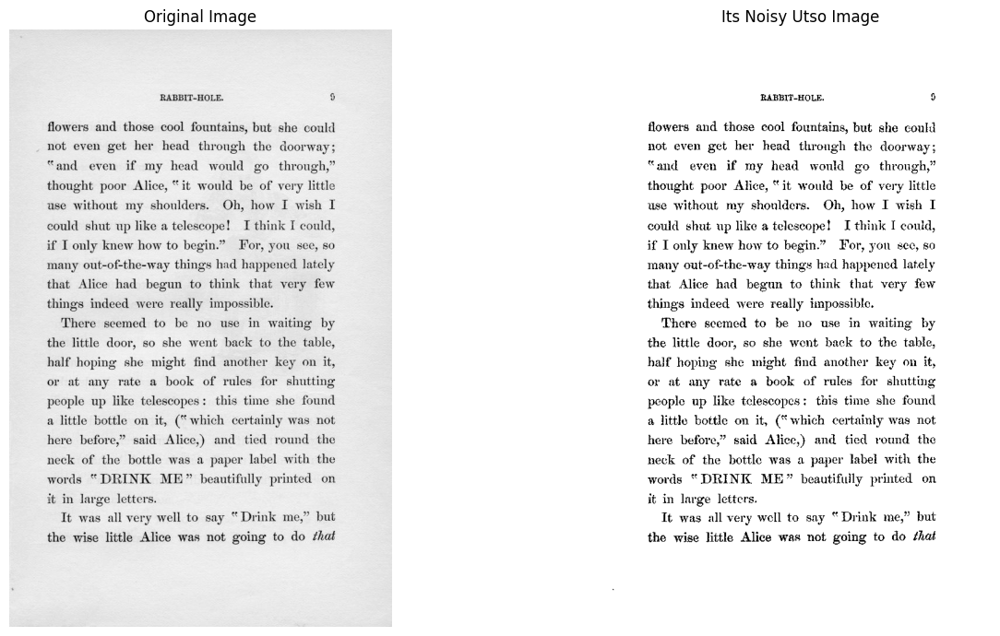

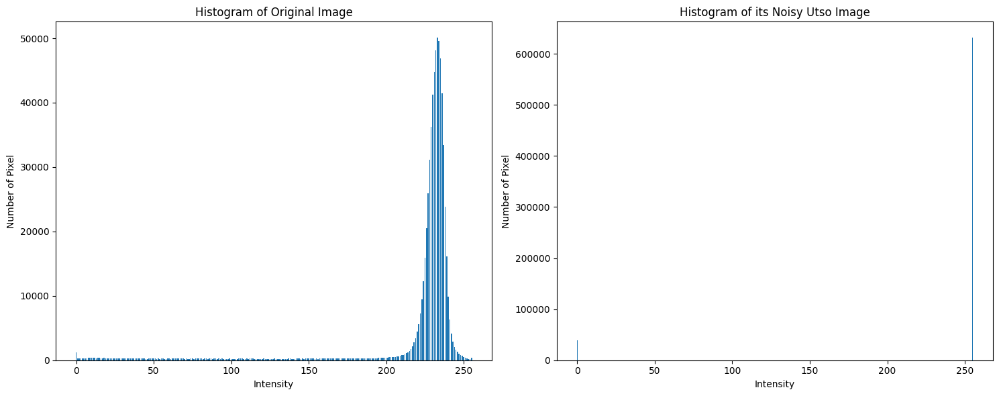

In [ ]:
npg1=noisy(pg1)
n_plot_img(pg1,npg1)
n_plot_hist(pg1,npg1)

2500


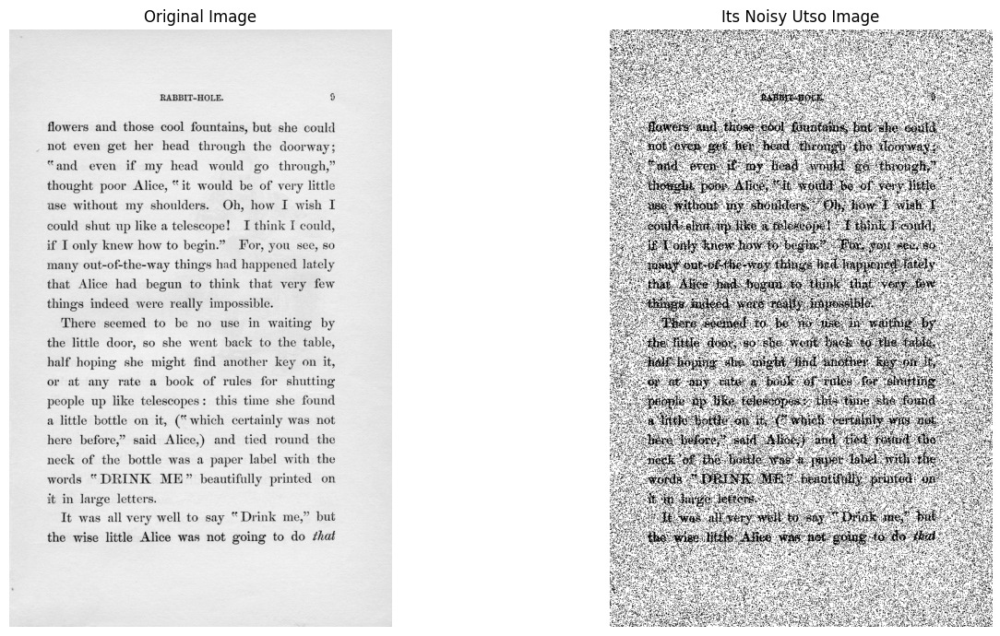

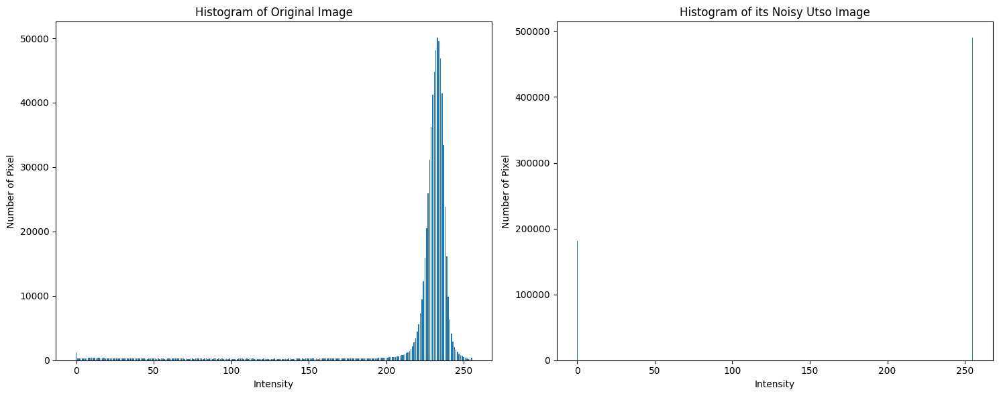

In [ ]:
npg1=noisy(pg1)
n_plot_img(pg1,npg1)
n_plot_hist(pg1,npg1)

225


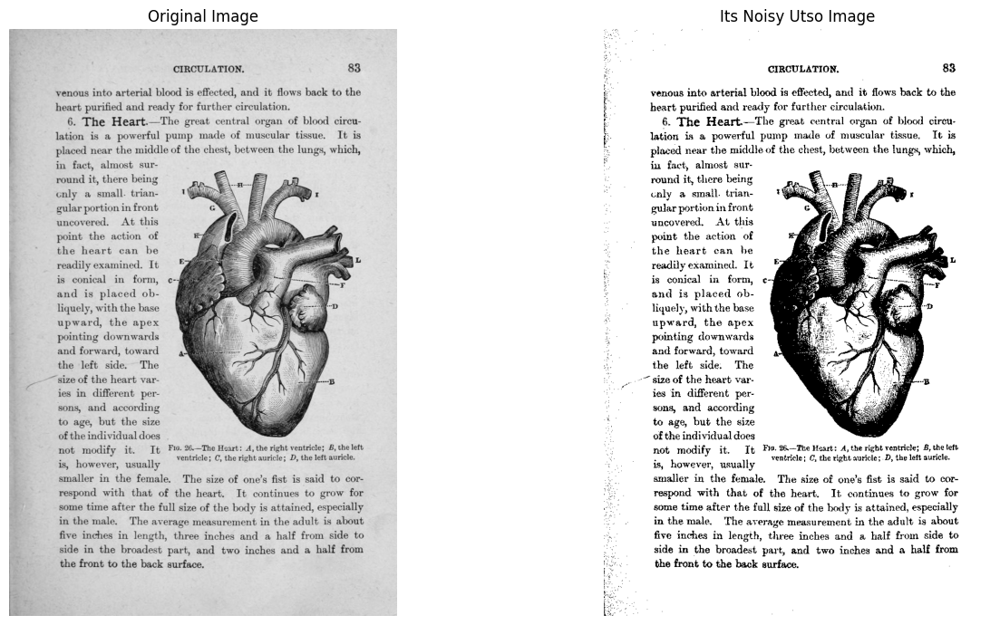

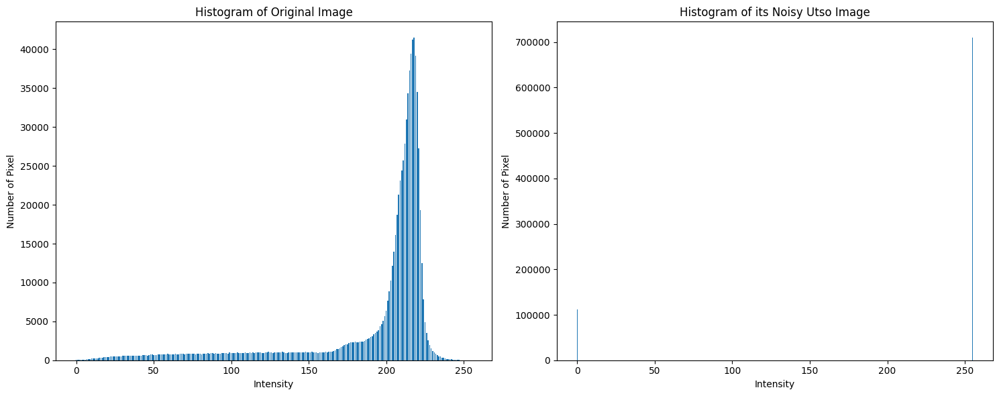

In [ ]:
npg2=noisy(pg2)
n_plot_img(pg2,npg2)
n_plot_hist(pg2,npg2)

2500


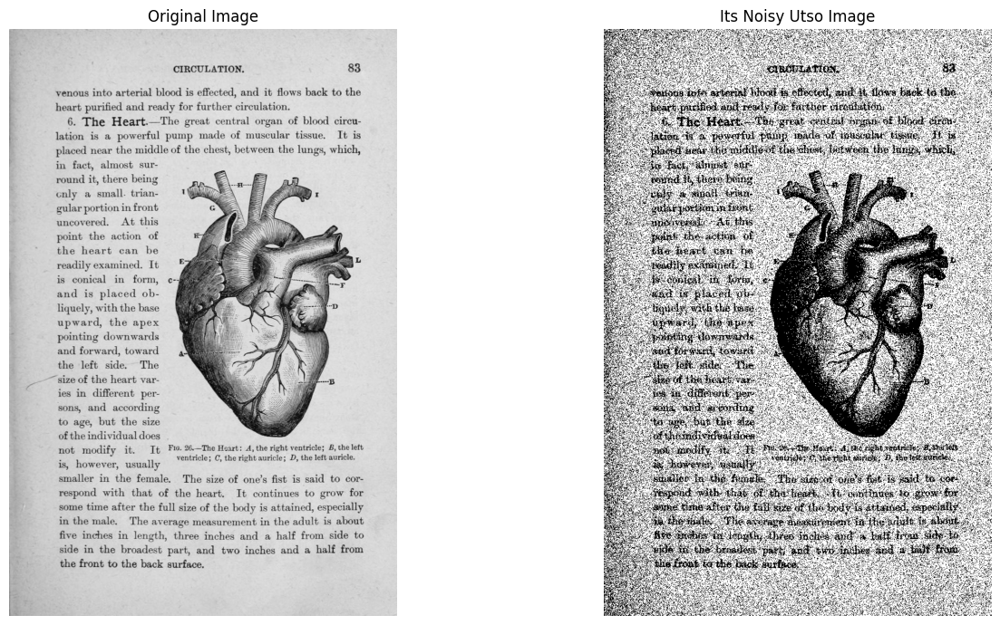

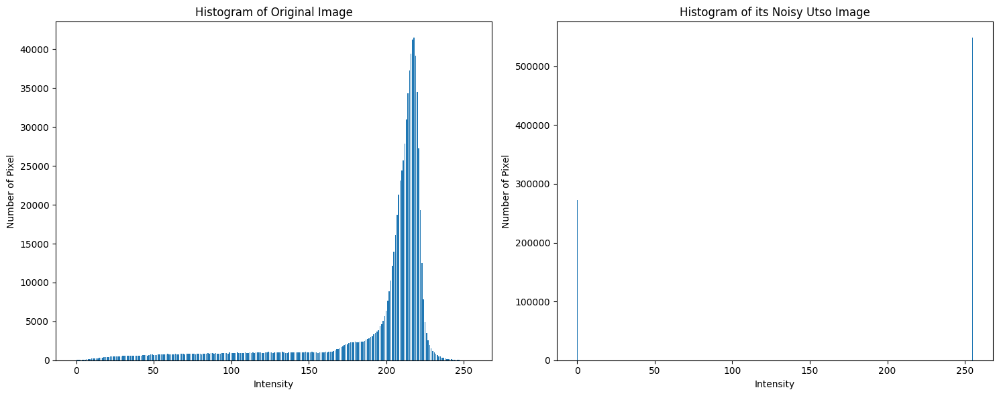

In [ ]:
npg2=noisy(pg2)
n_plot_img(pg2,npg2)
n_plot_hist(pg2,npg2)

225


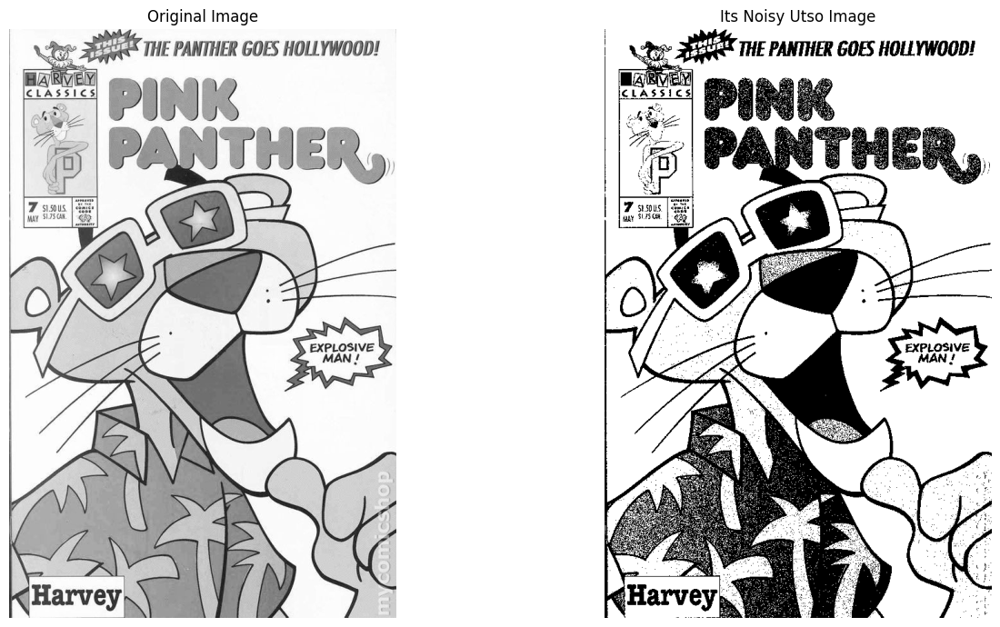

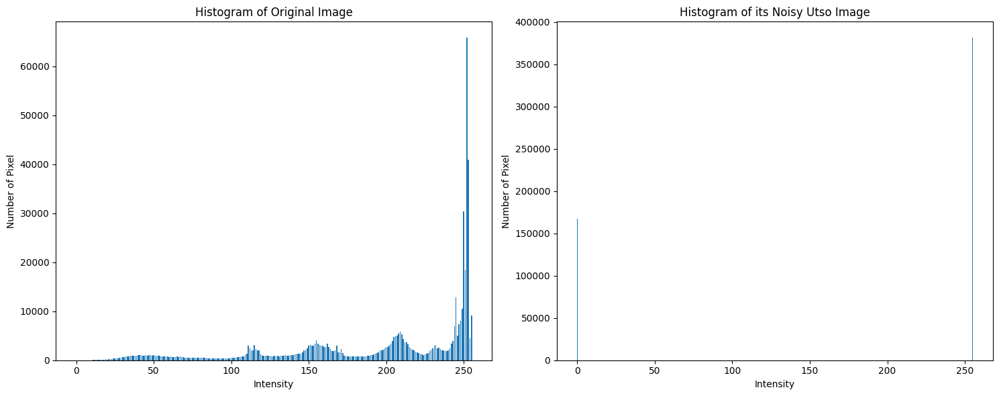

In [ ]:
npntr=noisy(pntr)
n_plot_img(pntr,npntr)
n_plot_hist(pntr,npntr)

2500


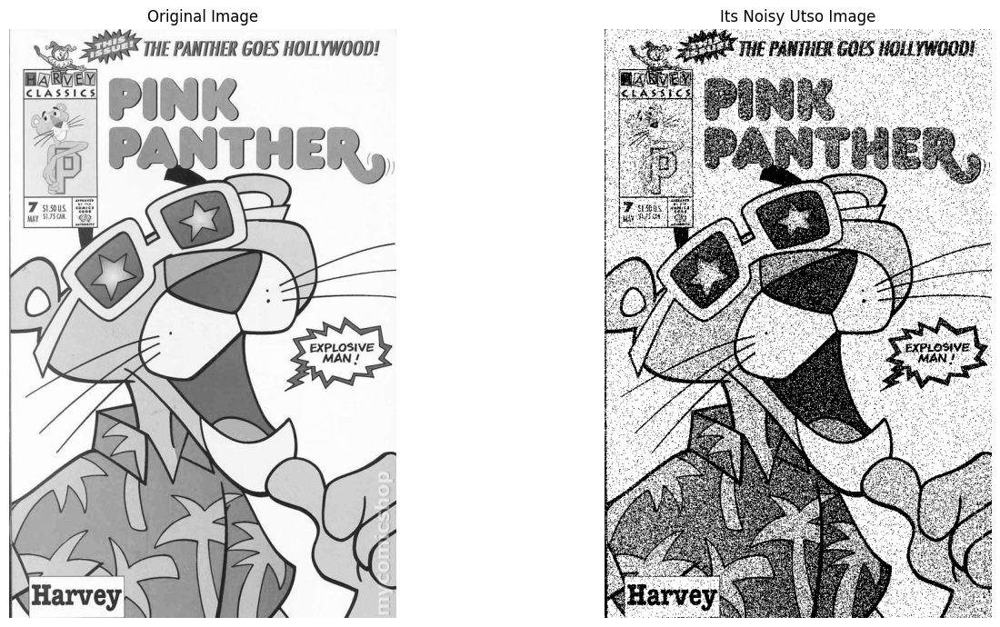

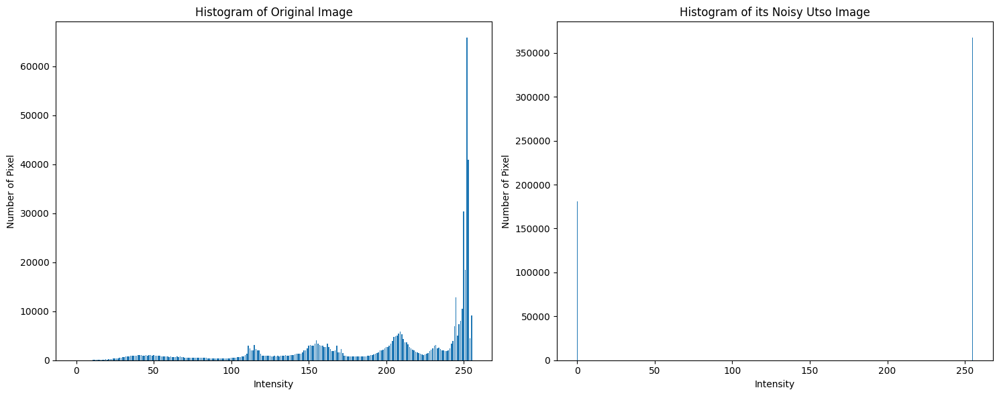

In [ ]:
npntr=noisy(pntr)
n_plot_img(pntr,npntr)
n_plot_hist(pntr,npntr)

225


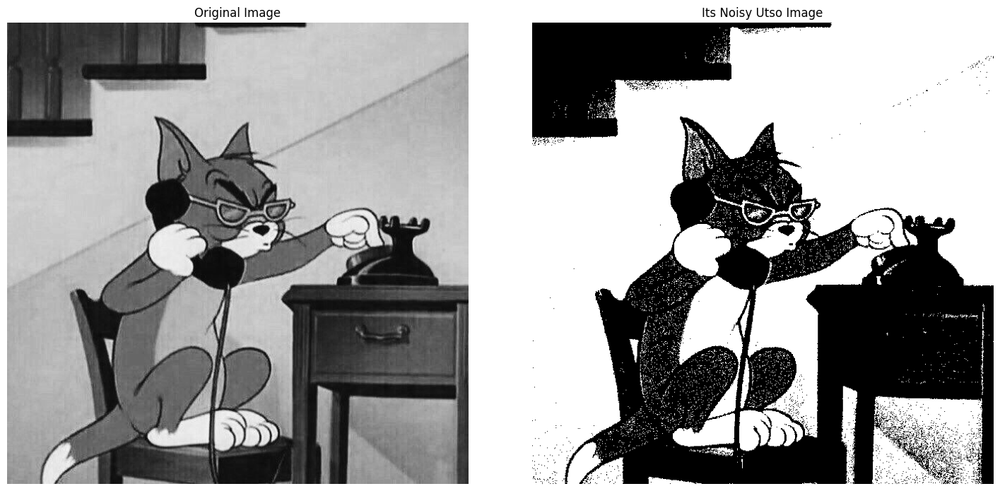

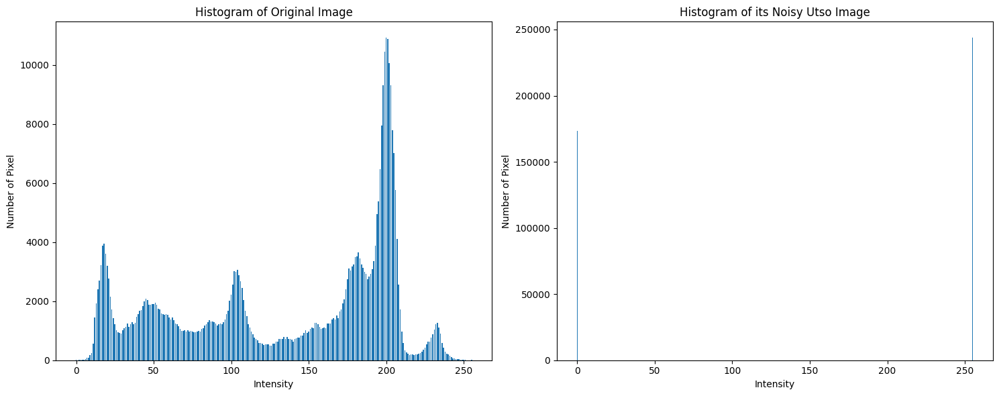

In [ ]:
ntom=noisy(tom)
n_plot_img(tom,ntom)
n_plot_hist(tom,ntom)

2500


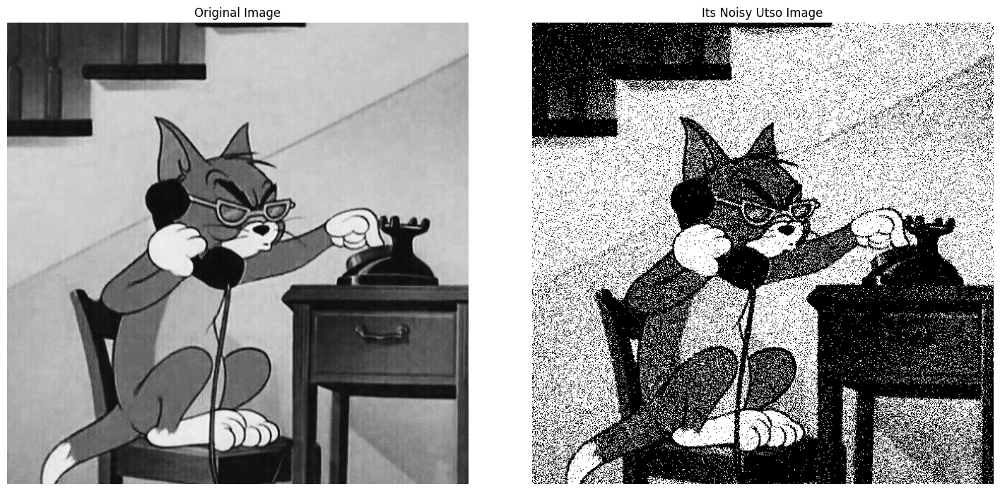

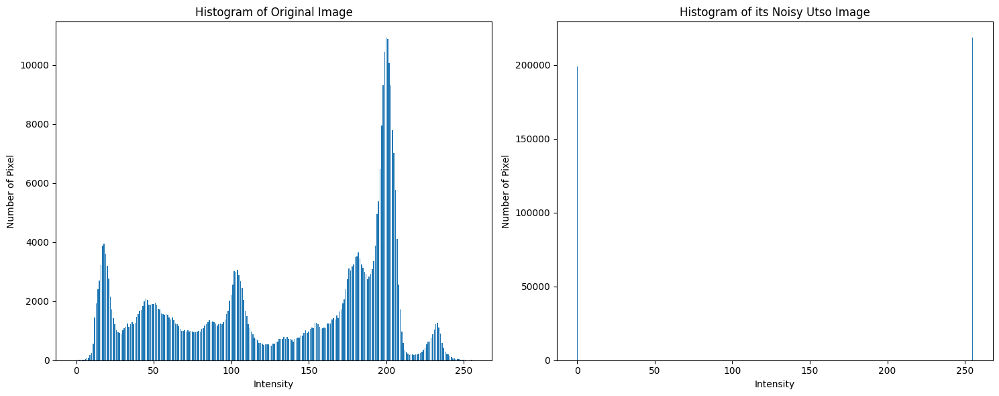

In [ ]:
ntom=noisy(tom)
n_plot_img(tom,ntom)
n_plot_hist(tom,ntom)

# References

Sources referred:
1. https://learnopencv.com/otsu-thresholding-with-opencv/

Peers Discussed:
1. Hasan Ali (23110133)
2. Nupoor Assudani (23110224)
3. Arin Mehta (23110038)